# Now we will load DESeq2 and perform PCA and differential expression

You will first need to install DESeq2. This is a program that runs in R, so we need to install it within R. First, we will use conda to download R in our anaconda. If you check which R before installing it to conda, it might take you to a R installation that already exists on TSCC. Since we want to be in control of our specific version and installs, we will use anaconda to install it.

    conda install -c r r
    
In order to run DESeq2, we need to update our verion of gcc (I found this out by trying to install DESeq2 and getting errors that it needs a newer version of this program. We are going to specify the version to download.

    conda install -c anaconda gcc=4.8.5

Open R in your terminal on TSCC by typing:

    R
    
This will now take you into R where you can do your installation. Note that your command line now has a > rather than your TSCC login. This is specific to the R language. Now you are coding in R, not BASH. Use the following two commands to install DESeq2:

    source("http://bioconductor.org/biocLite.R")
    
    biocLite("DESeq2")
    
It will ask you about updating packages:

    Update all/some/none? [a/s/n]: 
    
Type a to update all.
    
Did it work?

    library("DESeq2")
    
It should load without any error messages. To get back to a bash command line, quit R with:

    quit()
    
We want to install a few more packages with R that we will use later on. 

    conda install -c r r-essentials
    
*NOTE - there is a bug that occurs in DESeq2 installation if you install r-essentials before DESeq2. This is why I told you not to install this earlier. But now that we have already installed DESeq2, we can install r-essentials.*

In [1]:
suppressMessages(library("DESeq2"))
library("ggplot2")
library("RColorBrewer")

In [2]:
counts <- read.csv('/home/ucsd-train01/scratch/projects/lin28b_shrna/all_bams/counts_for_deseq2.csv',
                  header=TRUE, row.names=1)
counts$Length <- NULL
head(counts)

,lin28b_ctrl_rep1.bam,lin28b_ctrl_rep2.bam,lin28b_kd_rep1.bam,lin28b_kd_rep2.bam
ENSG00000223972.4,0,2,0,0
ENSG00000227232.4,294,294,334,410
ENSG00000243485.2,0,0,0,0
ENSG00000237613.2,0,2,4,7
ENSG00000268020.2,0,0,0,0
ENSG00000240361.1,0,0,0,0


In [3]:
col_data <- read.csv('/home/ucsd-train01/scratch/projects/lin28b_shrna/all_bams/conditions_matrix_deseq2.csv',
                  header=TRUE, row.names=1)
head(col_data)

,condition
lin28b_ctrl_rep1.bam,control
lin28b_ctrl_rep2.bam,control
lin28b_kd_rep1.bam,knockdown
lin28b_kd_rep2.bam,knockdown


In [4]:
dds <- DESeqDataSetFromMatrix(countData = counts,
                              colData = col_data,
                              design = ~ condition)

In [5]:
dds <- dds[ rowSums(counts(dds)) > 4, ]

In [6]:
dds <- DESeq(dds)

estimating size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing


In [8]:
res <- results(dds)
head(res)

log2 fold change (MAP): condition knockdown vs control 
Wald test p-value: condition knockdown vs control 
DataFrame with 6 rows and 6 columns
                    baseMean log2FoldChange      lfcSE       stat       pvalue
                   <numeric>      <numeric>  <numeric>  <numeric>    <numeric>
ENSG00000227232.4  330.36270     0.11828541 0.16941568  0.6981963 4.850544e-01
ENSG00000237613.2    2.97862     0.07435064 0.07772811  0.9565477 3.387956e-01
ENSG00000238009.2  126.66769     0.19090347 0.19835243  0.9624459 3.358257e-01
ENSG00000237683.5 1341.55539     0.61490428 0.13423407  4.5808361 4.631207e-06
ENSG00000239906.1   21.70825     0.32518780 0.17256041  1.8844867 5.949917e-02
ENSG00000241860.2  145.53255    -0.17864475 0.20303410 -0.8798756 3.789267e-01
                          padj
                     <numeric>
ENSG00000227232.4 0.6763457109
ENSG00000237613.2           NA
ENSG00000238009.2           NA
ENSG00000237683.5 0.0002161864
ENSG00000239906.1           NA
ENSG0000

In [9]:
write.csv(as.data.frame(res), file="/home/ucsd-train01/scratch/projects/lin28b_shrna/all_bams/differential_expression.csv")

In [13]:
summary(res)


out of 20367 with nonzero total read count
adjusted p-value < 0.1
LFC > 0 (up)     : 754, 3.7% 
LFC < 0 (down)   : 1136, 5.6% 
outliers [1]     : 0, 0% 
low counts [2]   : 11846, 58% 
(mean count < 211)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



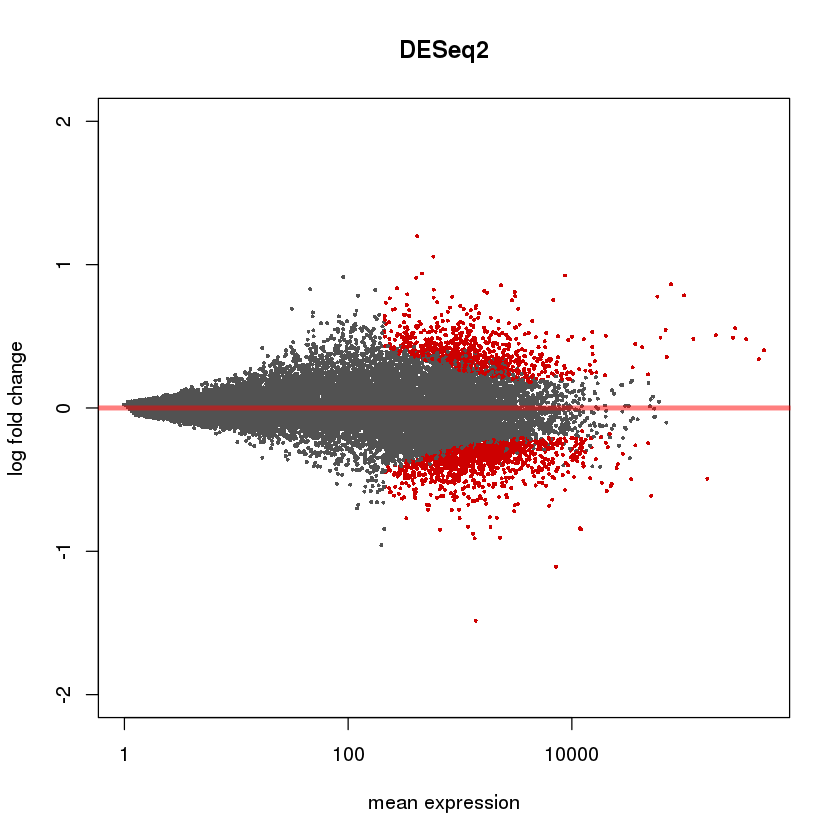

In [14]:
plotMA(res, main="DESeq2", ylim=c(-2,2))

In [10]:
res05 <- results(dds, alpha=0.05)
summary(res05)


out of 20367 with nonzero total read count
adjusted p-value < 0.05
LFC > 0 (up)     : 507, 2.5% 
LFC < 0 (down)   : 780, 3.8% 
outliers [1]     : 0, 0% 
low counts [2]   : 12241, 60% 
(mean count < 244)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



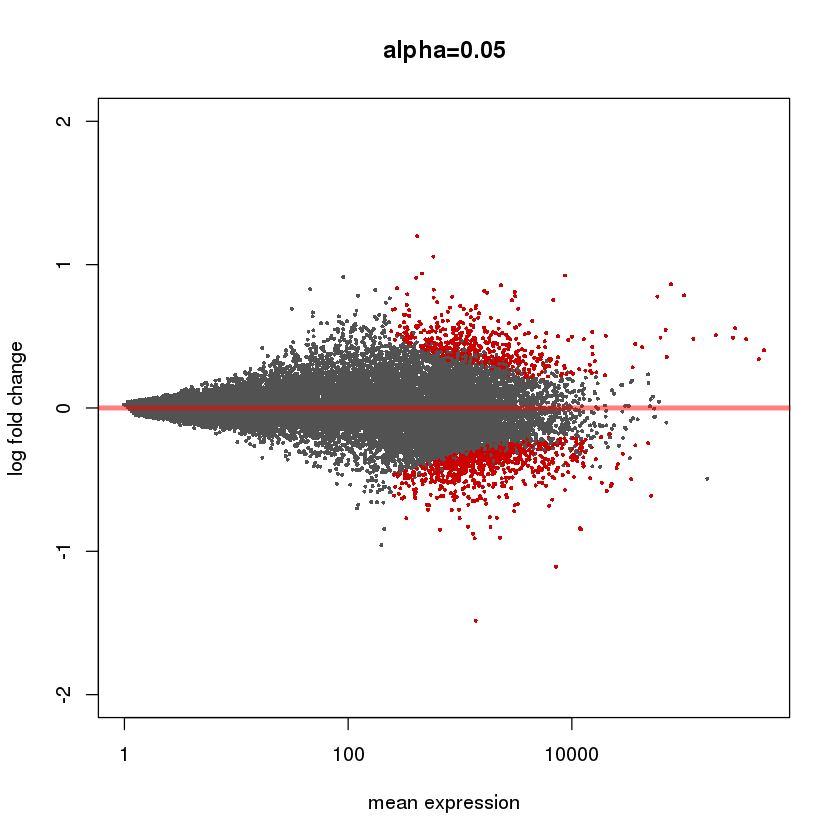

In [18]:
plotMA(res05, main="alpha=0.05", ylim=c(-2,2))

In [15]:
which.min(res$padj)

[1] 12213

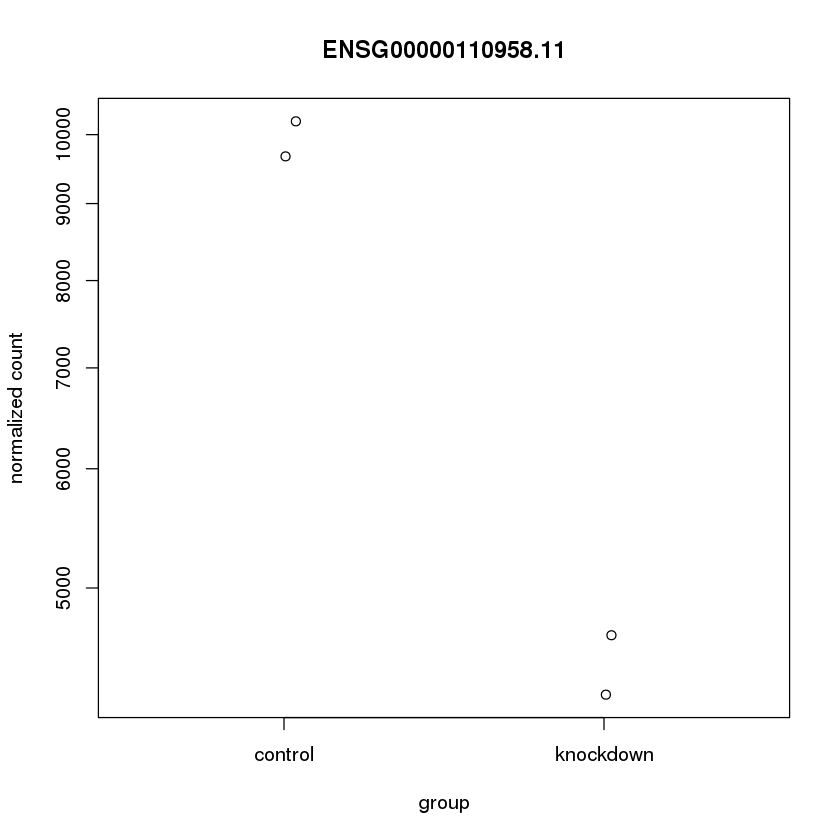

In [11]:
plotCounts(dds, gene=which.min(res$padj), intgroup="condition")

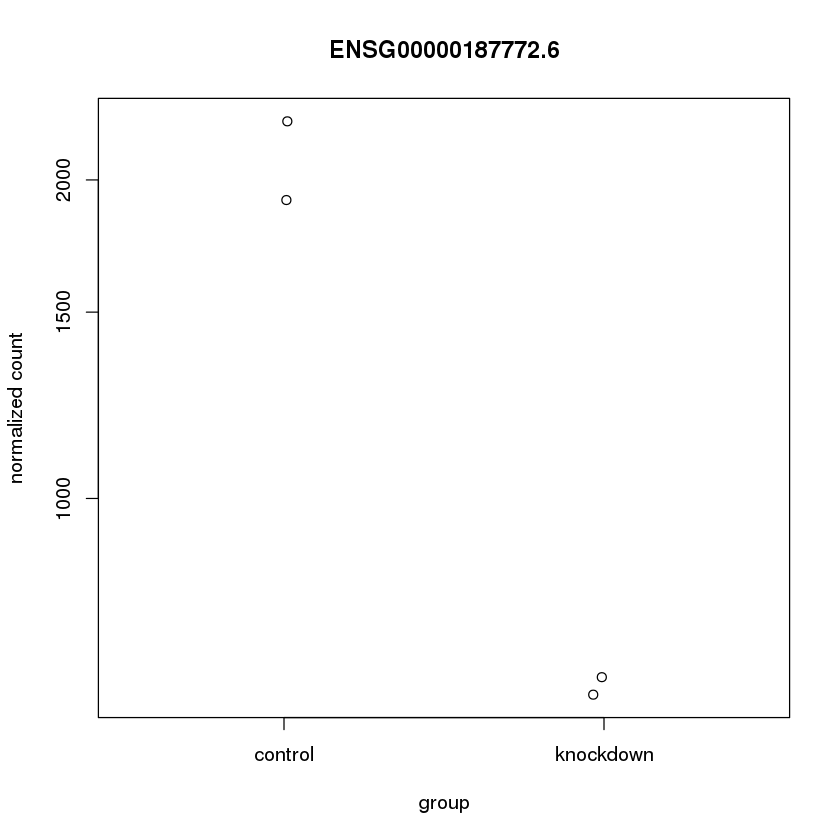

In [18]:
plotCounts(dds, gene='ENSG00000187772.6', intgroup="condition")

In [19]:
rld <- rlog(dds)
vsd <- varianceStabilizingTransformation(dds)

$y
[1] "PC2: 14% variance"

attr(,"class")
[1] "labels"

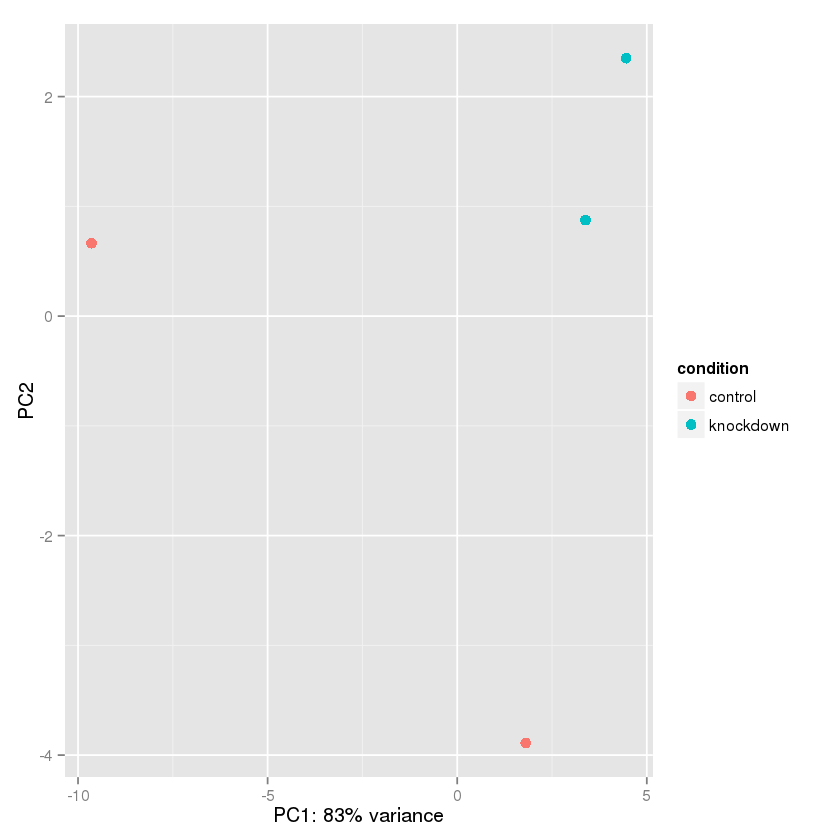

In [20]:
data <- plotPCA(rld, intgroup="condition", returnData=TRUE)
percentVar <- round(100 * attr(data, "percentVar"))
ggplot(data, aes(PC1, PC2, color=condition)) +
    geom_point(size=3) +
    xlab(paste0("PC1: ",percentVar[1],"% variance")) 
    ylab(paste0("PC2: ",percentVar[2],"% variance"))

In [22]:
sampleDists <- dist(t(assay(rld)))


sampleDistMatrix <- as.matrix(sampleDists)
rownames(sampleDistMatrix) <- paste(rld$condition)
colnames(sampleDistMatrix) <- paste(rld$condition)

Warning message:
In plot.window(...): "clustering_distance_rows" is not a graphical parameterWarning message:
In plot.window(...): "clustering_distance_cols" is not a graphical parameterWarning message:
In plot.xy(xy, type, ...): "clustering_distance_rows" is not a graphical parameterWarning message:
In plot.xy(xy, type, ...): "clustering_distance_cols" is not a graphical parameterWarning message:
In title(...): "clustering_distance_rows" is not a graphical parameterWarning message:
In title(...): "clustering_distance_cols" is not a graphical parameter

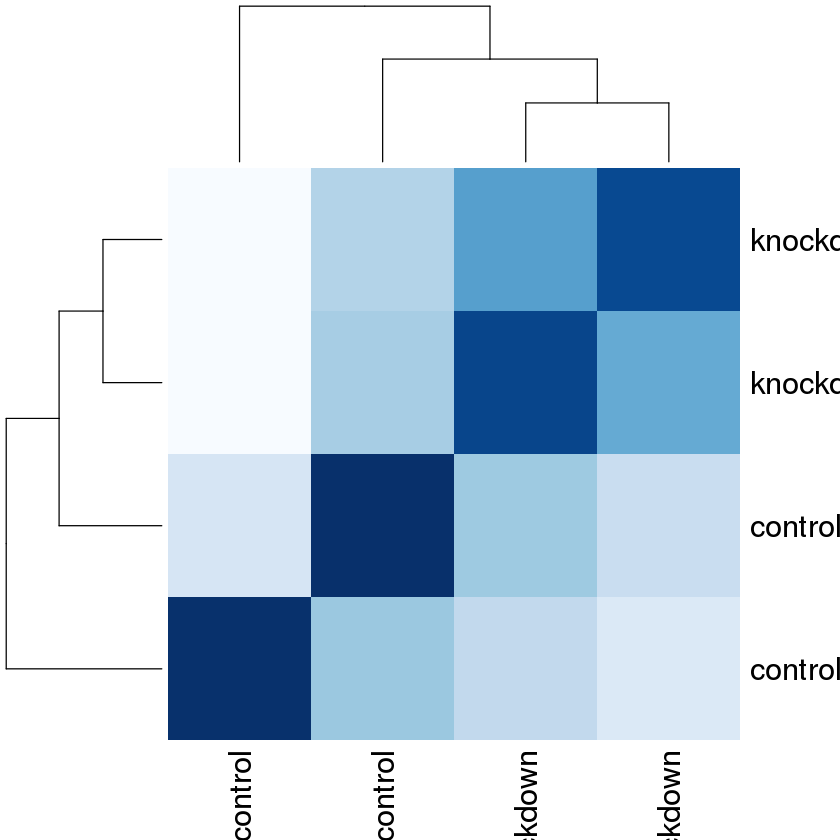

In [23]:
colors <- colorRampPalette( rev(brewer.pal(9, "Blues")) )(255)
heatmap(sampleDistMatrix,
clustering_distance_rows=sampleDists,
clustering_distance_cols=sampleDists,
col=colors)

**Q: How do I make a plot of the counts for the gene that has the smallest adjusted p-value?**